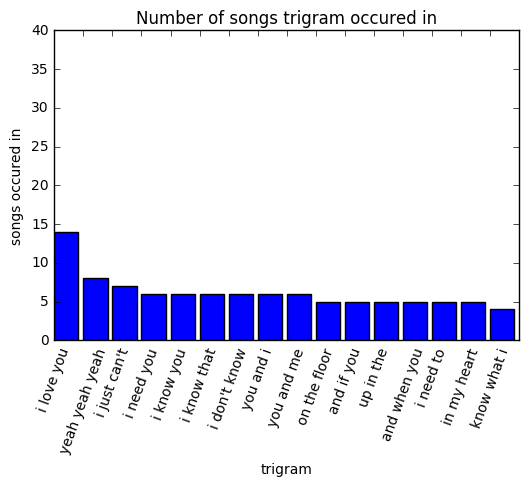

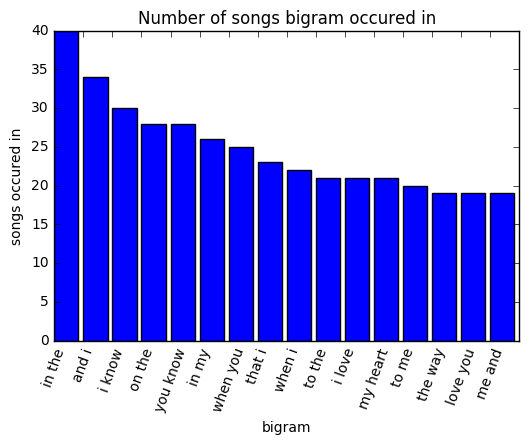

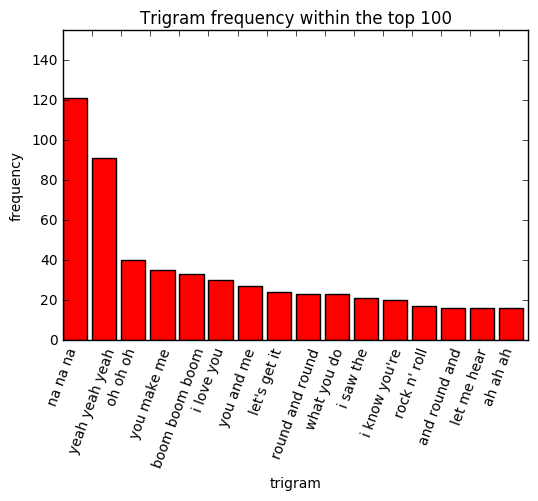

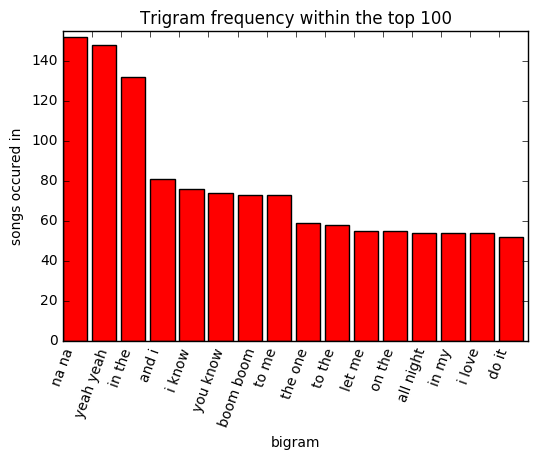

In [5]:
from NGRAMS import final_data

In [6]:
corpus_raw = " ".join(final_data["Lyric"])

In [7]:
# NATURAL LANGUAGE PROCESSING
import nltk
from nltk import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.stem.porter import PorterStemmer

# COUNTER CLASS
from collections import Counter

# SCIKIT LEARN
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsRegressor

# VISUALISATION
from matplotlib import pyplot as plt
%matplotlib inline
import wordcloud
from wordcloud import WordCloud, STOPWORDS
import random

# ELSE
from itertools import izip

In [8]:
stemmer = PorterStemmer().stem

def stem(tokens,stemmer = PorterStemmer().stem):
    return [stemmer(w.lower()) for w in tokens] 

In [9]:
lexical_tags = ["ADJ", "ADV", "NOUN", "VERB"]

In [10]:
lexical_corpus = [lexical_word[0].lower() for lexical_word in nltk.pos_tag(word_tokenize(corpus_raw), 'universal') if lexical_word[1] in lexical_tags]

In [11]:
lexical_corpus = [x for x in lexical_corpus if not "'" in x]

In [12]:
lexical_corpus = [x for x in lexical_corpus if not x in STOPWORDS]

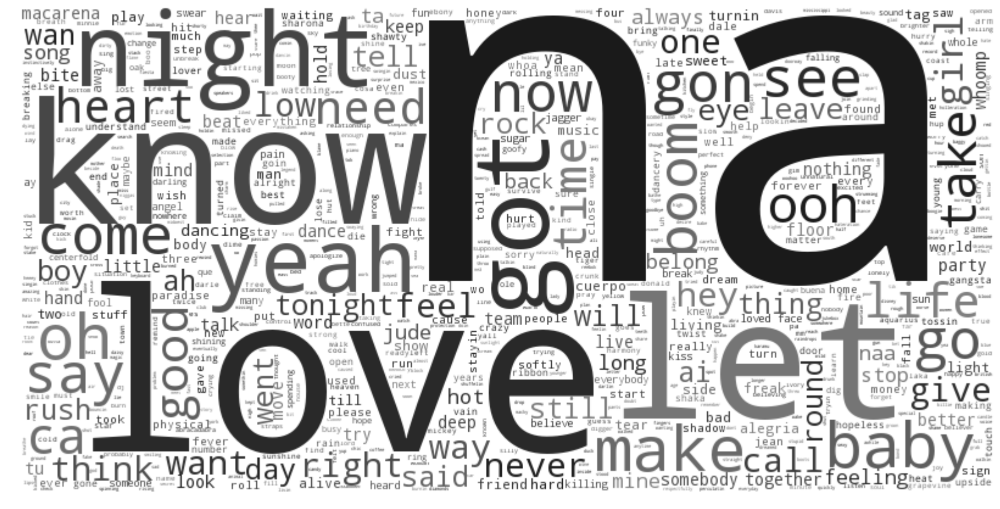

In [13]:
wc = WordCloud(background_color = "white", max_words=2000, stopwords=STOPWORDS, width=800, height=400)

# GENERATE WORD CLOUD
wc.generate(" ".join(lexical_corpus))

# COLORING
def grey_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "hsl(50, 0%%, %d%%)" % random.randint(10, 50)


# PLOTTING
plt.figure(figsize=(20,10))
plt.imshow(wc.recolor(color_func = grey_color_func, random_state=3))
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [14]:
Counter(lexical_corpus).most_common()

[(u'love', 288),
 (u'know', 231),
 (u'let', 211),
 (u'got', 189),
 (u'na', 180),
 (u'yeah', 173),
 (u'baby', 172),
 (u'night', 165),
 (u'make', 147),
 (u'come', 134),
 (u'say', 131),
 (u'go', 129),
 (u'gon', 126),
 (u'see', 122),
 (u'now', 121),
 (u'oh', 119),
 (u'boom', 114),
 (u'ca', 97),
 (u'life', 96),
 (u'good', 95),
 (u'ooh', 95),
 (u'take', 95),
 (u'need', 83),
 (u'right', 79),
 (u'heart', 78),
 (u'girl', 78),
 (u'hey', 76),
 (u'want', 75),
 (u'never', 74),
 (u'think', 74),
 (u'low', 72),
 (u'give', 71),
 (u'way', 71),
 (u'call', 71),
 (u'feel', 69),
 (u'time', 68),
 (u'will', 66),
 (u'tonight', 66),
 (u'leave', 63),
 (u'wan', 62),
 (u'one', 57),
 (u'still', 56),
 (u'rock', 56),
 (u'ah', 56),
 (u'ai', 55),
 (u'tell', 54),
 (u'said', 54),
 (u'went', 52),
 (u'rush', 52),
 (u'day', 52),
 (u'round', 51),
 (u'boy', 51),
 (u'always', 50),
 (u'long', 50),
 (u'ta', 48),
 (u'back', 46),
 (u'jude', 46),
 (u'eyes', 44),
 (u'hot', 43),
 (u'song', 43),
 (u'mine', 42),
 (u'together', 42),
 (u

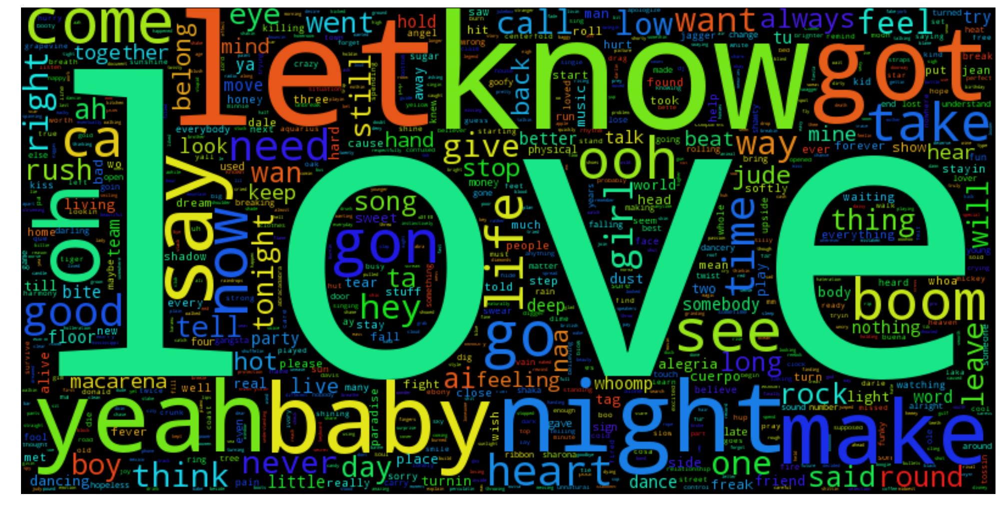

In [15]:

wc = WordCloud(background_color = "black", max_words=2000, stopwords=STOPWORDS.union(set(["na"])), width=800, height=400)

# GENERATE WORD CLOUD
wc.generate(" ".join(lexical_corpus))

# # COLORING
# def grey_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
#     return "hsl(50, 0%%, %d%%)" % random.randint(10, 50)


# PLOTTING
plt.figure(figsize=(20,10))
plt.imshow(wc)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [31]:
import ContentDensity

lexical_no_stop = ContentDensity.lexical_words_in_songs_no_stopwords
lex_df = final_data
lex_df["Lexical"] = lexical_no_stop

def word_cloud_time(df, beginYear, endYear):
    # get range of entries
    temp = df[df["Year"] >= beginYear]
    lex_list = temp[temp["Year"] <= endYear]["Lexical"]
    
    #lex_list = df[(df["Year"] >= beginYear) and (df["Year"] <= endYear)]
    # get the lexical
    entries = reduce(lambda x, y: x + y, lex_list, [])
    long_string = " ".join(entries)
    
    #print long_string
    
    #GENERATE WORD CLOUD
    wc.generate(long_string)

    # COLORING
    #def grey_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    #    return "hsl(50, 0%%, %d%%)" % random.randint(10, 50)

    # PLOTTING
    plt.figure(figsize=(20,10))
    plt.imshow(wc)#.recolor(color_func = grey_color_func, random_state=3))
    plt.axis("off")
    plt.tight_layout(pad=0)
    title = str(beginYear) + " to " + str(endYear)
    plt.title(title, fontsize = "50")
    plt.savefig(title + ".png", bbox_inches = "tight")
    plt.show()
    

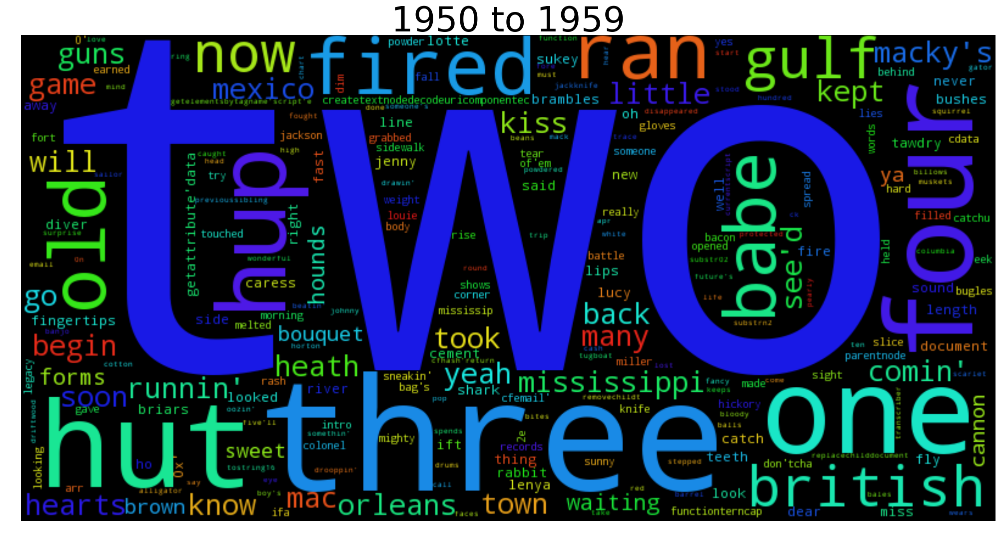

In [32]:
word_cloud_time(lex_df, 1950, 1959)

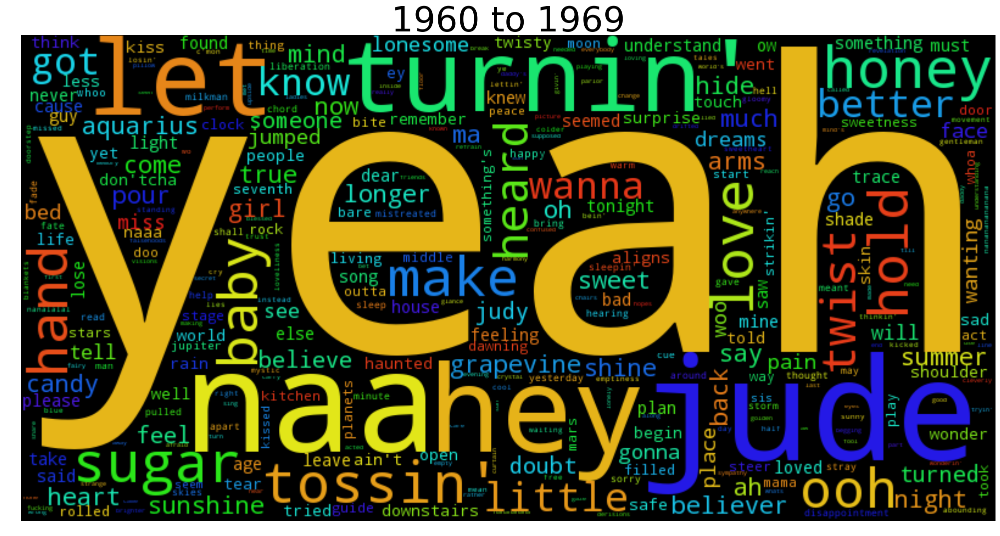

In [33]:
word_cloud_time(lex_df, 1960, 1969)

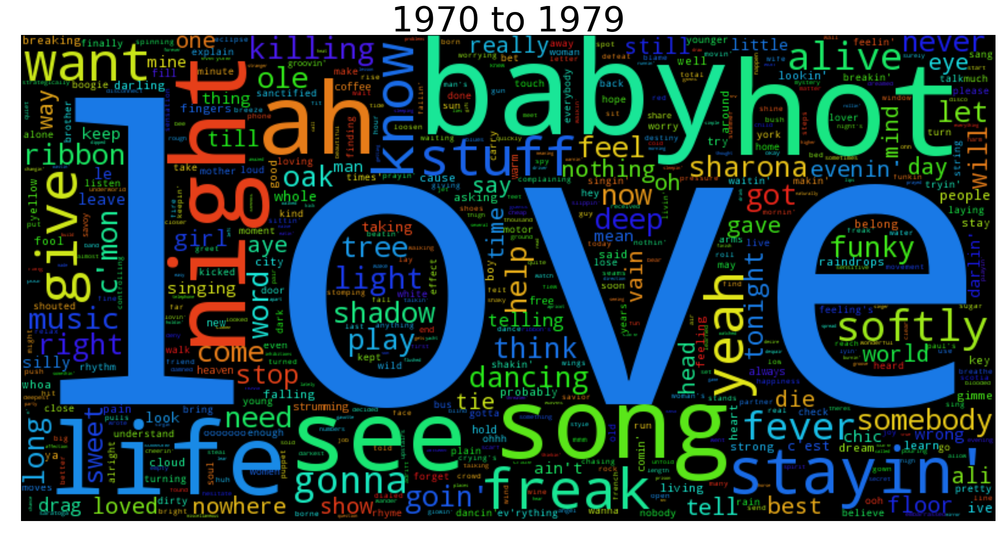

In [34]:
word_cloud_time(lex_df, 1970, 1979)

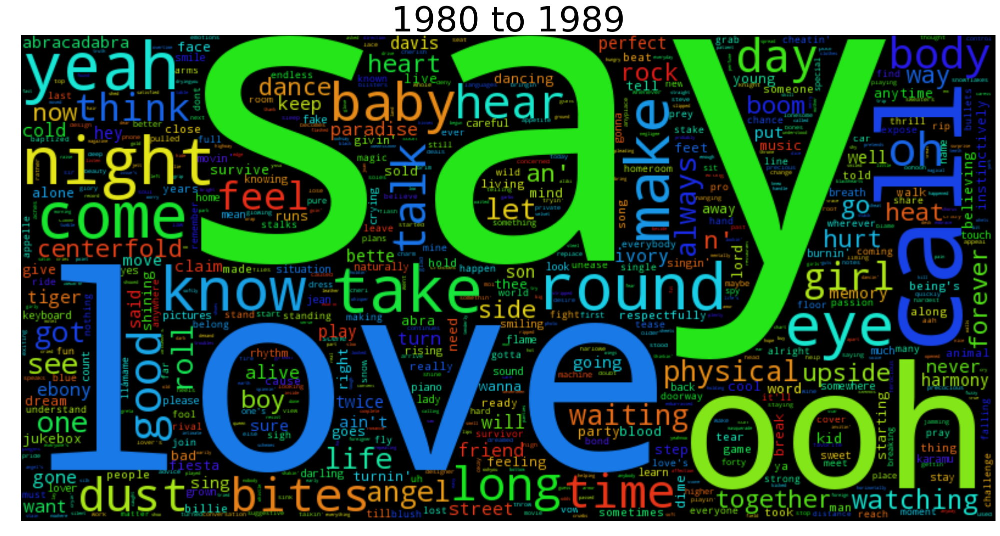

In [35]:
word_cloud_time(lex_df, 1980, 1989)

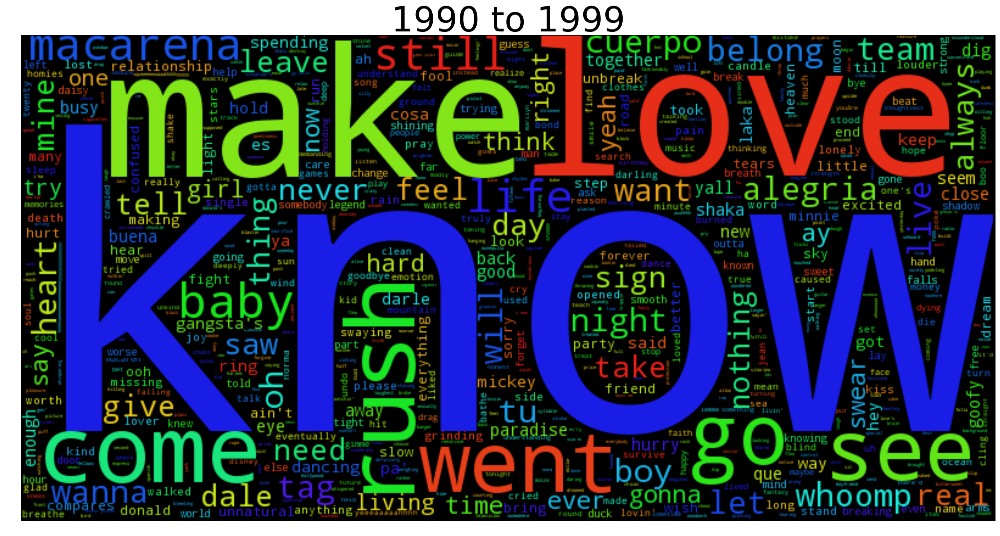

In [37]:
word_cloud_time(lex_df, 1990, 1999)


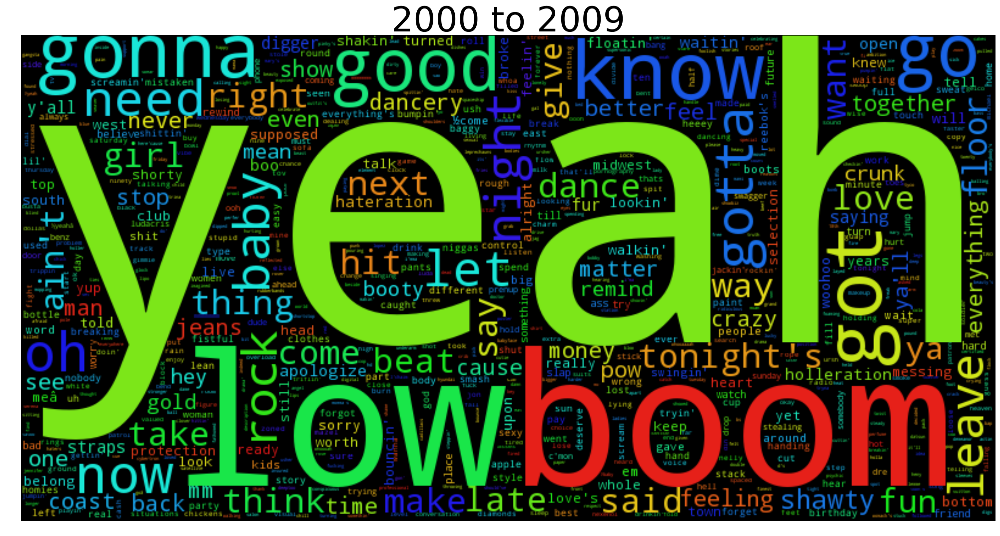

In [38]:
word_cloud_time(lex_df, 2000, 2009)


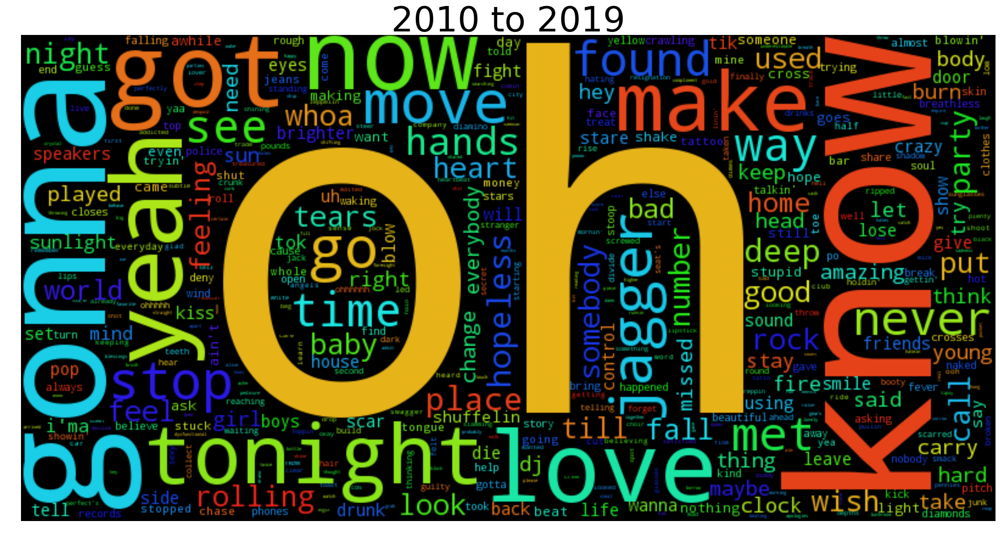

In [39]:
word_cloud_time(lex_df, 2010, 2019)